from google.colab import drive
drive.mount('/content/drive')

# /content/drive/Othercomputers/Mi portátil/Tareas Lap/LEAPS-2023-main/Chemulator-main/examples/6.5 - Time Depedent Chemistry-Copy1.ipynbm

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#plt.style.use("thesis")
from os.path import join
import seaborn as sns
from sys import path
path.insert(0,'/content/drive/Othercomputers/Mi portátil/Tareas Lap/LEAPS-2023-main/Chemulator-main/src')
from glob import glob
from chemulator import Chemulator
rollig_folder="../../Benchmarking/grid_inputs/"
import matplotlib.gridspec as gridspec
from time import perf_counter
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
import h5py
#from snapshot_functions import get_elemental_abundances

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#plt.style.use("thesis")
from os.path import join
import seaborn as sns
from sys import path
path.insert(0,'../src/')
from glob import glob
from chemulator import Chemulator
rollig_folder="../../Benchmarking/grid_inputs/"
import matplotlib.gridspec as gridspec
from time import perf_counter
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
import h5py
#from snapshot_functions import get_elemental_abundances

autoencoder_dir="/content/drive/Othercomputers/Mi portátil/Tareas Lap/LEAPS-2023-main/Chemulator-main/models/autoencoder-2021-release/"
emulator=Chemulator(autoencoder_dir=autoencoder_dir)
emulator.load_model("/content/drive/Othercomputers/Mi portátil/Tareas Lap/LEAPS-2023-main/Chemulator-main/models/emulator-2021-release/")

In [ ]:
autoencoder_dir="../models/autoencoder-2021-release/"
emulator=Chemulator(autoencoder_dir=autoencoder_dir)
emulator.load_model("../models/emulator-2021-release/")

data=pd.read_hdf("/content/drive/Othercomputers/Mi portátil/Tareas Lap/LEAPS-2023-main/Chemulator-main/examples/example_models.hdf",key="df").reset_index(drop=True)
data

In [ ]:
data=pd.read_hdf("example_models.hdf",key="df").reset_index(drop=True)
data

,model,Time,gas_density,gas_temp,dust_temp,av,radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
0,6939,1000.0,2548.6,71.53,10.0,2.455700e-21,0.870462,2.253720,0.082356,1.691810e-08,...,0.000044,3.584520e-13,1.805500e-07,1.256760e-11,1.660070e-10,1.430850e-14,0.000274,3.904811e+00,5.069267e-08,1.109323e-07
1,6939,2000.0,2548.6,143.13,11.56,2.455700e-21,0.870462,2.253720,0.600815,2.050690e-07,...,0.000044,4.747840e-13,3.937840e-08,2.172240e-12,1.437690e-10,2.427510e-14,0.000315,3.904811e+00,5.069267e-08,1.109323e-07
2,6939,3000.0,2548.6,77.07,11.56,2.455700e-21,0.870462,2.253720,0.821727,2.591190e-07,...,0.000044,1.003860e-12,5.880830e-08,5.979380e-12,2.442260e-10,1.866310e-13,0.000322,3.904811e+00,5.069267e-08,1.109323e-07
3,6939,4000.0,2548.6,52.04,11.56,2.455700e-21,0.870462,2.253720,0.916669,5.381340e-07,...,0.000044,4.781420e-13,2.503280e-08,4.993680e-13,1.365850e-10,5.641730e-14,0.000317,3.904811e+00,5.069267e-08,1.109323e-07
4,6939,5000.0,2548.6,41.72,11.56,2.455700e-21,0.870462,2.253720,0.957926,7.702370e-07,...,0.000044,4.422410e-13,1.968780e-08,1.554400e-13,1.326230e-10,1.686190e-14,0.000313,3.904811e+00,5.069267e-08,1.109323e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9997,4951,996000.0,989240.0,100.00,15.02,1.818800e-04,3.222924,1.917344,0.044288,1.090620e-09,...,0.000008,3.464270e-15,3.740030e-05,1.879980e-12,1.153870e-10,1.765000e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
9998,4951,997000.0,989240.0,100.00,15.02,1.818800e-04,3.222924,1.917344,0.044271,1.084560e-09,...,0.000008,3.461970e-15,3.740030e-05,1.884360e-12,1.151710e-10,1.763940e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
9999,4951,998000.0,989240.0,99.95,15.02,1.818800e-04,3.222924,1.917344,0.044270,1.084390e-09,...,0.000008,3.461900e-15,3.740030e-05,1.884470e-12,1.151650e-10,1.763910e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
10000,4951,999000.0,989240.0,99.82,15.02,1.818800e-04,3.222924,1.917344,0.044274,1.085810e-09,...,0.000008,3.462430e-15,3.740030e-05,1.883440e-12,1.152150e-10,1.764160e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04


In [ ]:
data.values[:,0]

array(['6939', '6939', '6939', ..., '4951', '4951', '4951'], dtype=object)

In [ ]:
print(max(np.log10(data["gas_temp"])))

3.924499996331074


#### We can take one random model between the 10 we have

In [ ]:
#first we set the initial and final time and the index for the element in the initial time
t0=1000
tf=1e6
#Now the indexes where the models star at t0
index=data[(data["Time"]==t0)].index
steps=int((tf-t0)/1000.0)-1

In [ ]:
emulator.physics_labels

['gas_temp',
 'gas_density',
 'radfield',
 'zeta',
 'coldens',
 'h2col',
 'ccol',
 'metallicity']

['gas_temp',
 'gas_density',
 'radfield',
 'zeta',
 'coldens',
 'h2col',
 'ccol',
 'metallicity']

In [ ]:
data.rename(columns={'radfield':  'local_radfield'})

,model,Time,gas_density,gas_temp,dust_temp,av,local_radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
0,6939,1000.0,2548.6,71.53,10.0,2.455700e-21,0.870462,2.253720,0.082356,1.691810e-08,...,0.000044,3.584520e-13,1.805500e-07,1.256760e-11,1.660070e-10,1.430850e-14,0.000274,3.904811e+00,5.069267e-08,1.109323e-07
1,6939,2000.0,2548.6,143.13,11.56,2.455700e-21,0.870462,2.253720,0.600815,2.050690e-07,...,0.000044,4.747840e-13,3.937840e-08,2.172240e-12,1.437690e-10,2.427510e-14,0.000315,3.904811e+00,5.069267e-08,1.109323e-07
2,6939,3000.0,2548.6,77.07,11.56,2.455700e-21,0.870462,2.253720,0.821727,2.591190e-07,...,0.000044,1.003860e-12,5.880830e-08,5.979380e-12,2.442260e-10,1.866310e-13,0.000322,3.904811e+00,5.069267e-08,1.109323e-07
3,6939,4000.0,2548.6,52.04,11.56,2.455700e-21,0.870462,2.253720,0.916669,5.381340e-07,...,0.000044,4.781420e-13,2.503280e-08,4.993680e-13,1.365850e-10,5.641730e-14,0.000317,3.904811e+00,5.069267e-08,1.109323e-07
4,6939,5000.0,2548.6,41.72,11.56,2.455700e-21,0.870462,2.253720,0.957926,7.702370e-07,...,0.000044,4.422410e-13,1.968780e-08,1.554400e-13,1.326230e-10,1.686190e-14,0.000313,3.904811e+00,5.069267e-08,1.109323e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9997,4951,996000.0,989240.0,100.00,15.02,1.818800e-04,3.222924,1.917344,0.044288,1.090620e-09,...,0.000008,3.464270e-15,3.740030e-05,1.879980e-12,1.153870e-10,1.765000e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
9998,4951,997000.0,989240.0,100.00,15.02,1.818800e-04,3.222924,1.917344,0.044271,1.084560e-09,...,0.000008,3.461970e-15,3.740030e-05,1.884360e-12,1.151710e-10,1.763940e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
9999,4951,998000.0,989240.0,99.95,15.02,1.818800e-04,3.222924,1.917344,0.044270,1.084390e-09,...,0.000008,3.461900e-15,3.740030e-05,1.884470e-12,1.151650e-10,1.763910e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04
10000,4951,999000.0,989240.0,99.82,15.02,1.818800e-04,3.222924,1.917344,0.044274,1.085810e-09,...,0.000008,3.462430e-15,3.740030e-05,1.883440e-12,1.152150e-10,1.764160e-15,0.000018,2.892011e+17,8.560156e+14,1.856038e+04


In [ ]:
models=[]
i=data[(data["coldens"]*6.289E-22>0.1) & (data["Time"]==t0)].index
i=np.random.choice(i,replace=False)
models.append(i)
i=data[(data["coldens"]*6.289E-22>5) & (data["gas_temp"]<100) & (data["Time"]==t0)].index
i=np.random.choice(i,replace=False)
models.append(i)
i=np.random.choice(data[(data["gas_temp"]>2000) & (data["Time"]==t0)].index,replace=False)
models.append(i)
i=np.random.choice(data[(data["zeta"]>1000) & (data["Time"]==t0)].index,replace=False)
models.append(i)
labels=["Av=0","High Av","High T","High $\zeta$"]

In [ ]:
models

[5002, 2001, 7002, 8002]

In [ ]:
init_cond=[]
for i in models:
    init_cond.append(emulator.prepare_inputs(
        data.loc[i:i].reset_index(drop=True),learn_scaling=False)
    )

C:\Users\Kingsman\.conda\envs\tf_cpu\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [ ]:
init_cond[0]

,gas_temp,gas_density,radfield,zeta,coldens,h2col,ccol,metallicity,Chem_1,Chem_2,Chem_3,Chem_4,Chem_5,Chem_6,Chem_7,Chem_8
0,0.846891,0.654314,0.818907,0.246925,0.879638,0.465691,0.842779,0.69317,0.023746,0.342222,0.243734,0.051764,0.555586,0.037899,0.778844,0.520721


In [ ]:
predictions=[]
steps=int((1e6-t0)/1000.0)-1
for cond in init_cond:
    cond_copy=cond.copy()
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    for step in range(steps):
        output = emulator.predict_multiple_timesteps(cond_copy,1)
        pred=pred.append(output,sort=False) #esto evalua el modelo
        cond_copy["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
        cond_copy[emulator.chem_labels]=output[emulator.chem_labels]
    predictions.append(pred)

C:\Users\Kingsman\.conda\envs\tf_cpu\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:108: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,"gas_temp"]=output[:,0]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAP

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:108: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3768315362.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

##### Now we have the 4 models for the step size=1000

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
predicted_vals=[]
for i in range(4):
    predicted_vals.append(emulator.recover_real_values(predictions[i])[plot_specs])

C:\Users\Kingsman\.conda\envs\tf_cpu\lib\site-packages\keras\engine\training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


In [ ]:
init_cond[0]

,gas_temp,gas_density,radfield,zeta,coldens,h2col,ccol,metallicity,Chem_1,Chem_2,Chem_3,Chem_4,Chem_5,Chem_6,Chem_7,Chem_8
0,0.846891,0.654314,0.818907,0.246925,0.879638,0.465691,0.842779,0.69317,0.023746,0.342222,0.243734,0.051764,0.555586,0.037899,0.778844,0.520721


In [ ]:
predicted_vals[0]

,gas_temp,dust_temp,H,H+,H2,C,C+,CO,O,O+,H2O
0,2172.577760,36.299718,1.000000,9.137409e-06,0.000117,2.101853e-08,3.146540e-05,1.329197e-08,0.000045,4.204298e-10,2.187849e-12
1,1232.155017,35.527056,1.000000,1.719590e-05,0.000349,6.962586e-08,5.009725e-05,1.131145e-07,0.000073,1.331578e-09,5.826229e-11
2,782.568385,33.576209,0.996751,1.609856e-05,0.000741,1.611505e-07,6.220580e-05,3.169494e-07,0.000101,1.861541e-09,4.062972e-10
3,562.826000,31.827019,0.842755,6.999162e-06,0.001368,3.672319e-07,4.303960e-05,7.513497e-07,0.000103,6.913862e-10,1.483568e-09
4,464.055240,31.224826,0.722546,1.868430e-06,0.002770,1.394553e-06,1.727413e-05,1.638948e-06,0.000096,1.248926e-10,4.672866e-09
...,...,...,...,...,...,...,...,...,...,...,...
993,11.484264,31.979877,0.000010,3.825526e-11,0.403494,3.736844e-05,5.084958e-10,6.696202e-05,0.000171,1.028599e-16,9.824394e-07
994,11.484264,31.979877,0.000010,3.825526e-11,0.403494,3.736844e-05,5.084958e-10,6.696202e-05,0.000171,1.028599e-16,9.824394e-07
995,11.484264,31.979877,0.000010,3.825526e-11,0.403494,3.736844e-05,5.084958e-10,6.696202e-05,0.000171,1.028599e-16,9.824394e-07
996,11.484264,31.979877,0.000010,3.825526e-11,0.403494,3.736844e-05,5.084958e-10,6.696202e-05,0.000171,1.028599e-16,9.824394e-07


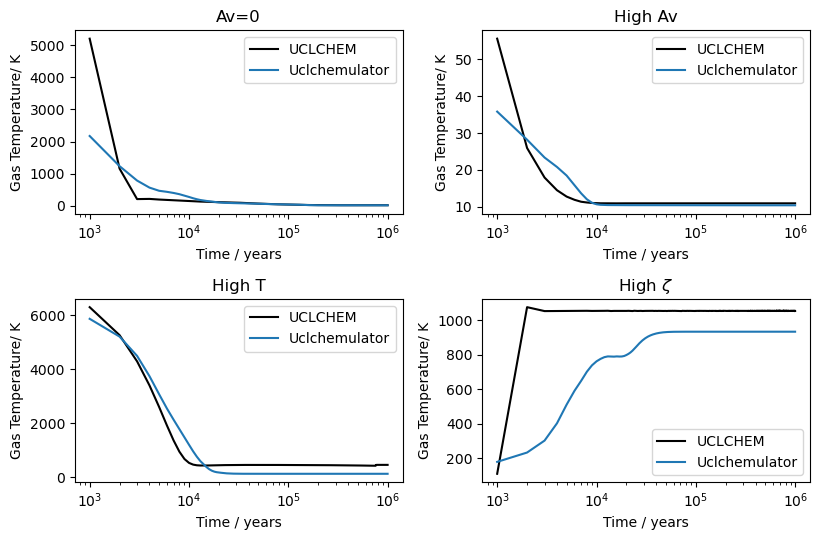

In [ ]:
fig,axes=plt.subplots(2,2,figsize=(8.3,5.5),tight_layout=True)
axes=axes.flatten()

for i,ax in enumerate(axes):
    j=models[i]
    time=data.loc[j:j+steps-1,"Time"].values
    real_temp=data.loc[j:j+steps-1,"gas_temp"].values
    ax.plot(time,real_temp,label="UCLCHEM",color="black")
    ax.plot(time,predicted_vals[i]["gas_temp"],label="Uclchemulator")
    ax.set(xscale="log")
    ax.legend()
    ax.set(ylabel="Gas Temperature/ K",xlabel="Time / years")
    ax.set(title=labels[i])
#fig.savefig("dataset_time_testing.png",dpi=300)

In [ ]:
models

[5002, 2001, 7002, 8002]

##### Let's take one by one of the models and take the three different timesteps

In [ ]:
j=models[0]
data_av0=data.loc[j:j+steps-1]

In [ ]:
data_av0 #actual data
data_av0['dust_temp']=pd.to_numeric(data_av0['dust_temp'])

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\2905009599.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_av0['dust_temp']=pd.to_numeric(data_av0['dust_temp'])


In [ ]:
pred_av0 = predicted_vals[0] #predicciones

def get_plot_df(real,pred):
    df=pd.DataFrame({"Real":real,"Predicted":pred})
    df=df.groupby("Real")["Predicted"].agg([lambda x: np.percentile(x,10),
            lambda x: np.percentile(x,50),
            lambda x: np.percentile(x,90)]).reset_index()
    df.columns=["Real","lower","median","upper"]
    return df

# real_vals.shape
real=data_av0[plot_specs]
#predicted_vals.shape
predicted=pred_av0

predicted=predicted.to_numpy()
real=real.to_numpy()

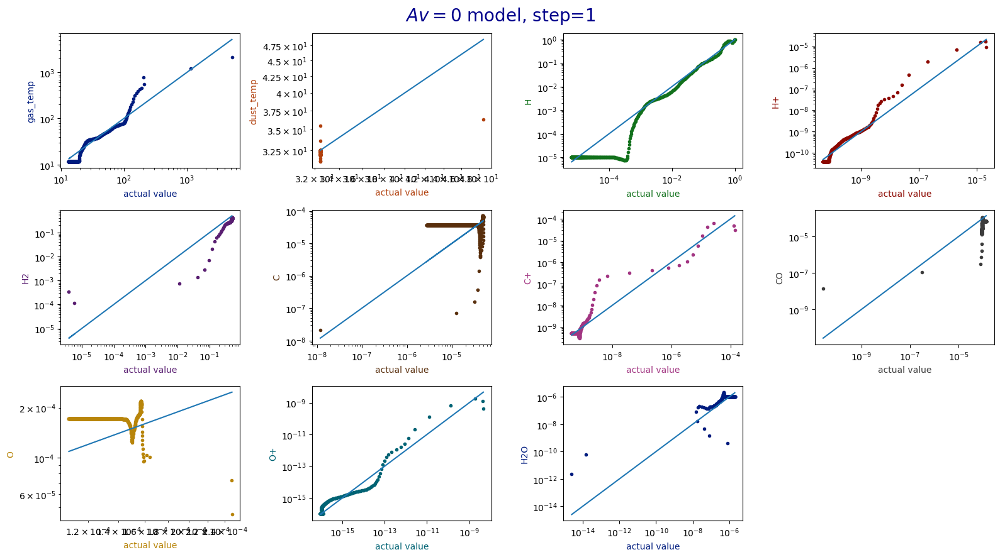

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
#fig,ax=plt.subplots(figsize=(25,12))
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(data_av0[plot_specs[j]],pred_av0[plot_specs[j]],'.', color=colors[i])
    ax.plot(data_av0[plot_specs[j]],data_av0[plot_specs[j]])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('$Av=0$ model, step=1', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

# Now lets try with the three time-steps for the four models

In [ ]:
steps_1=int((1e6-t0)/1000.0)-1
steps_10=int((1e6-t0)/10000.0)-1
steps_100=int((1e6-t0)/100000.0)-1

cond=init_cond[0]
predictions_av0=[]
inicio=time.time()
for p in range(len(pasos)): #esto toma los tres diferentes pasos
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    paso=10**p
    for step in range(pasos[p]):
        print(paso)
end=time.time()

pred_1=predictions

In [ ]:
steps=steps_10
pred_10=[]
for cond in init_cond:
    cond_copy=cond.copy()
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    for step in range(steps):
        output = emulator.predict_multiple_timesteps(cond_copy,10)
        pred=pred.append(output,sort=False) #esto evalua el modelo
        cond_copy["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
        cond_copy[emulator.chem_labels]=output[emulator.chem_labels]
    pred_10.append(pred)

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:108: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,"gas_temp"]=output[:,0]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if colu

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3619172124.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

In [ ]:
steps=steps_100
pred_100=[]
for cond in init_cond:
    cond_copy=cond.copy()
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    for step in range(steps):
        output = emulator.predict_multiple_timesteps(cond_copy,100)
        pred=pred.append(output,sort=False) #esto evalua el modelo
        cond_copy["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
        cond_copy[emulator.chem_labels]=output[emulator.chem_labels]
    pred_100.append(pred)

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:108: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,"gas_temp"]=output[:,0]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\2442666438.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if colu

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\2442666438.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\2442666438.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\2442666438.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\2442666438.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

In [ ]:
pred_1=[]
steps=int((1e6-t0)/1000.0)-1
for cond in init_cond:
    cond_copy=cond.copy()
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    for step in range(steps):
        output = emulator.predict_multiple_timesteps(cond_copy,1)
        pred=pred.append(output,sort=False) #esto evalua el modelo
        cond_copy["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
        cond_copy[emulator.chem_labels]=output[emulator.chem_labels]
    pred_1.append(pred)

predictions=[]
steps=int((1e6-t0)/1000.0)-1
for cond in init_cond:
    cond_copy=cond
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    for step in range(steps):
        output = emulator.predict_multiple_timesteps(cond_copy,1)
        pred=pred.append(output,sort=False) #esto evalua el modelo
        cond_copy["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
        cond_copy[emulator.chem_labels]=output[emulator.chem_labels]
    predictions.append(pred)

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:108: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,"gas_temp"]=output[:,0]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if colu

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\C

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, 

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:108: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,"gas_temp"]=output[:,0]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if col

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  input_data.loc[:,self.chem_labels]=output[:,2:]
C:\Users\Kingsman\AppData\Local\Temp\ipykernel_2596\3083338905.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
C:\Users\Kingsman\Desktop\Tareas Lap\LEAPS-2023-main\Chemulator-main\examples\../src\chemulator.py:109: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or,

In [ ]:
init_cond[0]

,gas_temp,gas_density,radfield,zeta,coldens,h2col,ccol,metallicity,Chem_1,Chem_2,Chem_3,Chem_4,Chem_5,Chem_6,Chem_7,Chem_8
0,0.021402,0.654314,0.818907,0.246925,0.879638,0.465691,0.842779,0.69317,0.63384,0.261453,0.228731,0.537194,0.799399,0.053658,0.137503,0.225103


### Now we recover the real values

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
predicted_1=[]
predicted_10=[]
predicted_100=[]
for i in range(4):
    predicted_1.append(emulator.recover_real_values(pred_1[i])[plot_specs])
    predicted_10.append(emulator.recover_real_values(pred_10[i])[plot_specs])
    predicted_100.append(emulator.recover_real_values(pred_100[i])[plot_specs])

In [ ]:
len(predicted_100[0])
#predcitions has the values of the [1k,10k,100k]
#And each one of that list has the models [Av=0,high Av, high T, high Z]

8

In [ ]:
998000/8

124750.0

In [ ]:
real_1=[]
for i in models:
    real_1.append(data.loc[i:i+steps_1-1])

#real_1=[] este ya está
real_10=[]
for i in models:
    v=[]
    for j in range(1,99):
        v.append(data.loc[round(i + 10*j):round(i + 10*j)])
        #v=pd.concat(v, axis=0)
    real_10.append(pd.concat(v, axis=0))

# real_100=[]
# for i in models:
#     v=[]
#     for j in range(8):
#         v.append(data.loc[round(i + 142.3*j):round(i + 142.3*j)])
#         #v=pd.concat(v, axis=0)
#     real_100.append(pd.concat(v, axis=0))

real_100=[]
for i in models:
    v=[]
    for j in range(1,9):
        v.append(data.loc[round(i + 124.75*j):round(i + 124.75*j)])
        #v=pd.concat(v, axis=0)
    real_100.append(pd.concat(v, axis=0))



In [ ]:
real_100[0]

,model,Time,gas_density,gas_temp,dust_temp,av,radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
5127,4674,126000.0,18685.0,25.40,32.47,51.878,8189.3607,0.30318,0.001748,9.554490e-11,...,1.412250e-06,7.652200e-17,0.000094,1.534350e-11,6.382290e-09,3.448490e-15,1.413390e-06,8.248975e+22,5.493718e+13,1.058395e+17
5252,4674,251000.0,18685.0,15.02,32.47,51.878,8189.3607,0.30318,0.000034,6.757940e-11,...,8.138330e-07,8.784400e-17,0.000108,1.698940e-11,9.563530e-09,4.212540e-15,8.148360e-07,8.248975e+22,5.493718e+13,1.058395e+17
5376,4674,375000.0,18685.0,13.55,32.47,51.878,8189.3607,0.30318,0.000010,6.103250e-11,...,7.121270e-07,9.675110e-17,0.000118,1.972570e-11,1.466740e-08,4.733570e-15,7.130370e-07,8.248975e+22,5.493718e+13,1.058395e+17
5501,4674,500000.0,18685.0,13.40,32.47,51.878,8189.3607,0.30318,0.000009,5.711130e-11,...,6.758350e-07,1.035200e-16,0.000125,2.234450e-11,2.273970e-08,5.671370e-15,6.766820e-07,8.248975e+22,5.493718e+13,1.058395e+17
5626,4674,625000.0,18685.0,13.44,32.47,51.878,8189.3607,0.30318,0.000008,5.433260e-11,...,6.550520e-07,1.092910e-16,0.000130,2.443080e-11,3.521650e-08,7.229710e-15,6.558560e-07,8.248975e+22,5.493718e+13,1.058395e+17
5750,4674,749000.0,18685.0,13.56,32.47,51.878,8189.3607,0.30318,0.000007,5.227300e-11,...,6.422370e-07,1.149820e-16,0.000134,2.608820e-11,5.431590e-08,9.698370e-15,6.430120e-07,8.248975e+22,5.493718e+13,1.058395e+17
5875,4674,874000.0,18685.0,13.75,32.47,51.878,8189.3607,0.30318,0.000007,5.066440e-11,...,6.347890e-07,1.216780e-16,0.000136,2.744090e-11,8.414180e-08,1.361060e-14,6.355450e-07,8.248975e+22,5.493718e+13,1.058395e+17
6000,4674,999000.0,18685.0,14.00,32.47,51.878,8189.3607,0.30318,0.000006,4.937000e-11,...,6.312560e-07,1.305950e-16,0.000137,2.856200e-11,1.307300e-07,1.976070e-14,6.319960e-07,8.248975e+22,5.493718e+13,1.058395e+17


In [ ]:
real_1[0]

,model,Time,gas_density,gas_temp,dust_temp,av,radfield,zeta,H,H+,...,MG+,CO+,CO,HCO+,O2,O2+,E-,coldens,h2col,ccol
5002,4674,1000.0,18685.0,5208.70,48.54,51.878,8189.3607,0.30318,0.999967,2.103100e-05,...,2.152090e-05,1.317600e-13,2.606750e-11,8.240150e-16,5.797530e-14,1.048570e-12,1.831020e-04,8.248975e+22,5.493718e+13,1.058395e+17
5003,4674,2000.0,18685.0,1154.80,32.47,51.878,8189.3607,0.30318,0.999972,2.037170e-05,...,2.151580e-05,3.470140e-13,3.132760e-07,7.265230e-13,1.288910e-13,3.274830e-12,1.697440e-04,8.248975e+22,5.493718e+13,1.058395e+17
5004,4674,3000.0,18685.0,204.89,32.47,51.878,8189.3607,0.30318,0.977366,1.307760e-05,...,2.149580e-05,6.413570e-11,8.126090e-05,1.236740e-08,2.954260e-08,3.698510e-10,6.201980e-05,8.248975e+22,5.493718e+13,1.058395e+17
5005,4674,4000.0,18685.0,210.53,32.47,51.878,8189.3607,0.30318,0.917003,2.039570e-06,...,2.136340e-05,2.765410e-12,8.699570e-05,2.198560e-10,4.798690e-08,2.200920e-11,3.996820e-05,8.248975e+22,5.493718e+13,1.058395e+17
5006,4674,5000.0,18685.0,190.71,32.47,51.878,8189.3607,0.30318,0.860442,1.985730e-07,...,2.131690e-05,5.887930e-13,8.909750e-05,9.987080e-11,2.547820e-08,1.562930e-12,3.274820e-05,8.248975e+22,5.493718e+13,1.058395e+17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,4674,994000.0,18685.0,13.99,32.47,51.878,8189.3607,0.30318,0.000006,4.941730e-11,...,6.313370e-07,1.301760e-16,1.374440e-04,2.852070e-11,1.284370e-07,1.945750e-14,6.320780e-07,8.248975e+22,5.493718e+13,1.058395e+17
5996,4674,995000.0,18685.0,13.99,32.47,51.878,8189.3607,0.30318,0.000006,4.940780e-11,...,6.313200e-07,1.302590e-16,1.374540e-04,2.852900e-11,1.288920e-07,1.951770e-14,6.320620e-07,8.248975e+22,5.493718e+13,1.058395e+17
5997,4674,996000.0,18685.0,13.99,32.47,51.878,8189.3607,0.30318,0.000006,4.939830e-11,...,6.313040e-07,1.303430e-16,1.374640e-04,2.853730e-11,1.293490e-07,1.957810e-14,6.320450e-07,8.248975e+22,5.493718e+13,1.058395e+17
5998,4674,997000.0,18685.0,13.99,32.47,51.878,8189.3607,0.30318,0.000006,4.938890e-11,...,6.312880e-07,1.304260e-16,1.374740e-04,2.854550e-11,1.298070e-07,1.963880e-14,6.320290e-07,8.248975e+22,5.493718e+13,1.058395e+17


time10=np.arange(0,998000,10000)
time10.shape

Text(0.5, 0.98, 'time-step = 1k')

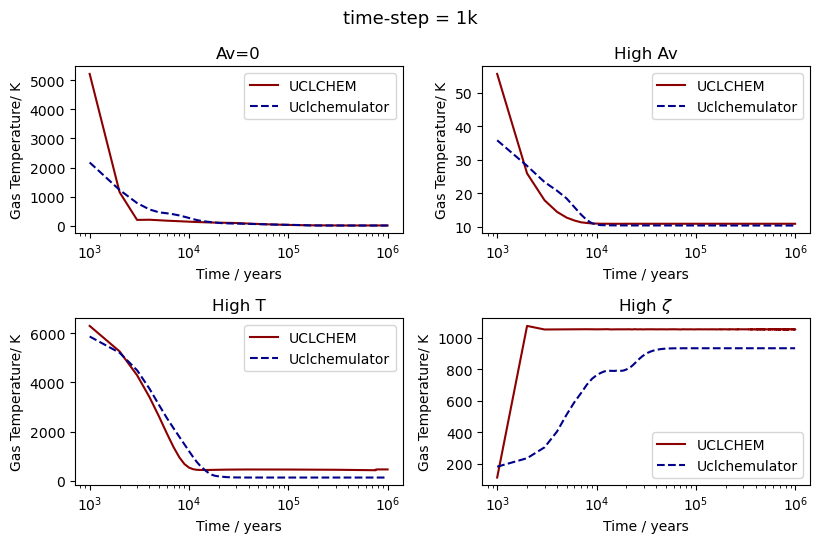

In [ ]:
fig,axes=plt.subplots(2,2,figsize=(8.3,5.5),tight_layout=True)
axes=axes.flatten()
for i,ax in enumerate(axes):
    j=models[i]
    time1=data.loc[j:j+steps_1-1,"Time"].values
    time10=np.arange(10000,990000,10000)
    ax.plot(time1,real_1[i]['gas_temp'],label="UCLCHEM",color="darkred")
    ax.plot(time1,predicted_1[i]["gas_temp"],'--',label="Uclchemulator",color='darkblue')

    #ax.plot(time10,real_10[i]['gas_temp'],label="UCLCHEM",color="black")
    #ax.plot(time10,predicted_10[i]["gas_temp"],label="Uclchemulator")
    ax.set(xscale="log")
    ax.legend()
    ax.set(ylabel="Gas Temperature/ K",xlabel="Time / years")
    ax.set(title=labels[i])
fig.suptitle('time-step = 1k', fontsize=13,color='black')
#fig.savefig("dataset_time_testing.png",dpi=300)

Text(0.5, 0.98, 'time-step = 10k')

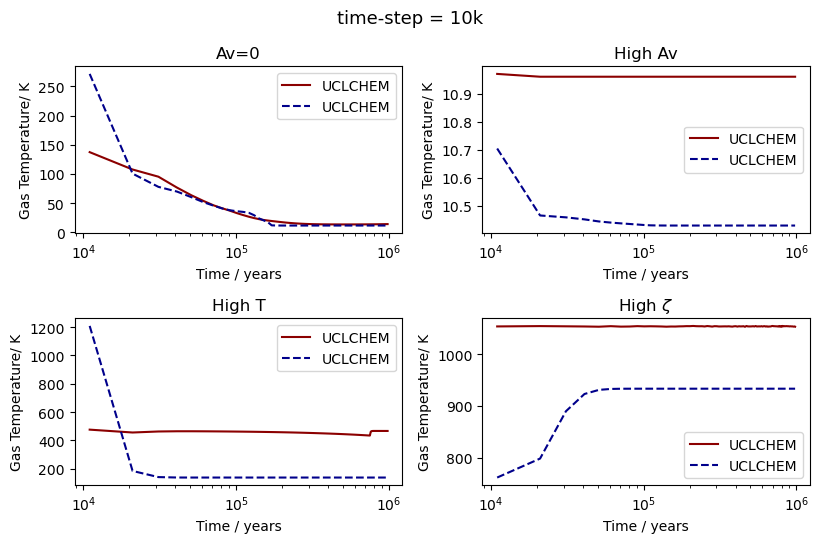

In [ ]:
fig,axes=plt.subplots(2,2,figsize=(8.3,5.5),tight_layout=True)
axes=axes.flatten()
for i,ax in enumerate(axes):
    j=models[i]
    time1=data.loc[j:j+steps_1-1,"Time"].values
    time10=np.arange(10000,990000,10000)
    #ax.plot(real_100[i]['Time'],real_100[i]['gas_temp'],label="UCLCHEM",color="black")
    ax.plot(real_10[i]['Time'],real_10[i]['gas_temp'],label="UCLCHEM",color="darkred")
    ax.plot(real_10[i]['Time'],predicted_10[i]["gas_temp"],'--',label="UCLCHEM",color="darkblue")
    #ax.plot(time1,real_1[i]['gas_temp'],label="UCLCHEM",color="black",ls='--')
    #ax.plot(real_100[i]['Time'],predicted_100[i]["gas_temp"],label="Uclchemulator")

    #ax.plot(time10,real_10[i]['gas_temp'],label="UCLCHEM",color="black")
    #ax.plot(time10,predicted_10[i]["gas_temp"],label="Uclchemulator")
    ax.set(xscale="log")
    ax.legend()
    ax.set(ylabel="Gas Temperature/ K",xlabel="Time / years")
    ax.set(title=labels[i])
fig.suptitle('time-step = 10k', fontsize=13,color='black')
#fig.savefig("dataset_time_testing.png",dpi=300)

Text(0.5, 0.98, 'time-step = 100k')

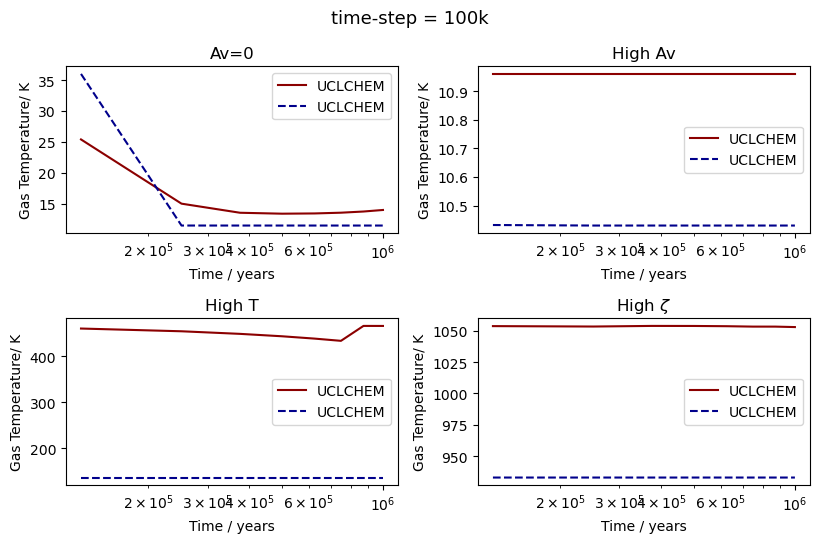

In [ ]:
fig,axes=plt.subplots(2,2,figsize=(8.3,5.5),tight_layout=True)
axes=axes.flatten()
for i,ax in enumerate(axes):
    j=models[i]
    #ax.plot(real_100[i]['Time'],real_100[i]['gas_temp'],label="UCLCHEM",color="black")
    ax.plot(real_100[i]['Time'],real_100[i]['gas_temp'],label="UCLCHEM",color="darkred")
    ax.plot(real_100[i]['Time'],predicted_100[i]["gas_temp"],'--',label="UCLCHEM",color="darkblue")
    #ax.plot(time1,real_1[i]['gas_temp'],label="UCLCHEM",color="black",ls='--')
    #ax.plot(real_100[i]['Time'],predicted_100[i]["gas_temp"],label="Uclchemulator")

    #ax.plot(time10,real_10[i]['gas_temp'],label="UCLCHEM",color="black")
    #ax.plot(time10,predicted_10[i]["gas_temp"],label="Uclchemulator")
    ax.set(xscale="log")
    ax.legend()
    ax.set(ylabel="Gas Temperature/ K",xlabel="Time / years")
    ax.set(title=labels[i])
fig.suptitle('time-step = 100k', fontsize=13,color='black')
#fig.savefig("dataset_time_testing.png",dpi=300)

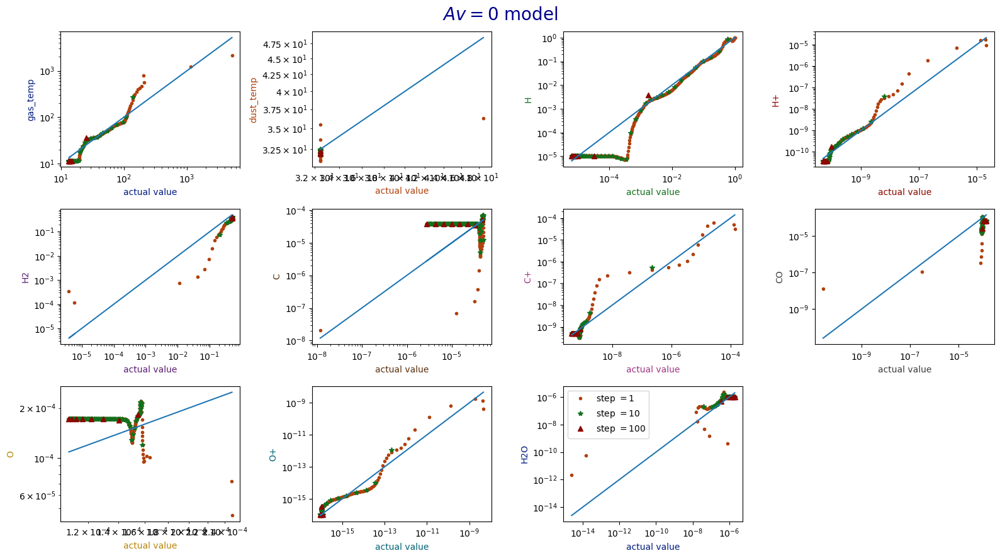

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
#fig,ax=plt.subplots(figsize=(25,12))
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(real_1[0][plot_specs[j]],predicted_1[0][plot_specs[j]],'.',
            color=colors[1],label='step $=1$')
    ax.plot(real_10[0][plot_specs[j]],predicted_10[0][plot_specs[j]],'*',
            color=colors[2], label='step $=10$')
    ax.plot(real_100[0][plot_specs[j]],predicted_100[0][plot_specs[j]],'^',
            color=colors[3], label='step $=100$')
    ax.plot(real_1[0][plot_specs[j]],real_1[0][plot_specs[j]])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('$Av=0$ model', fontsize=20, color='darkblue')
ax.legend()

axes[-1].remove()

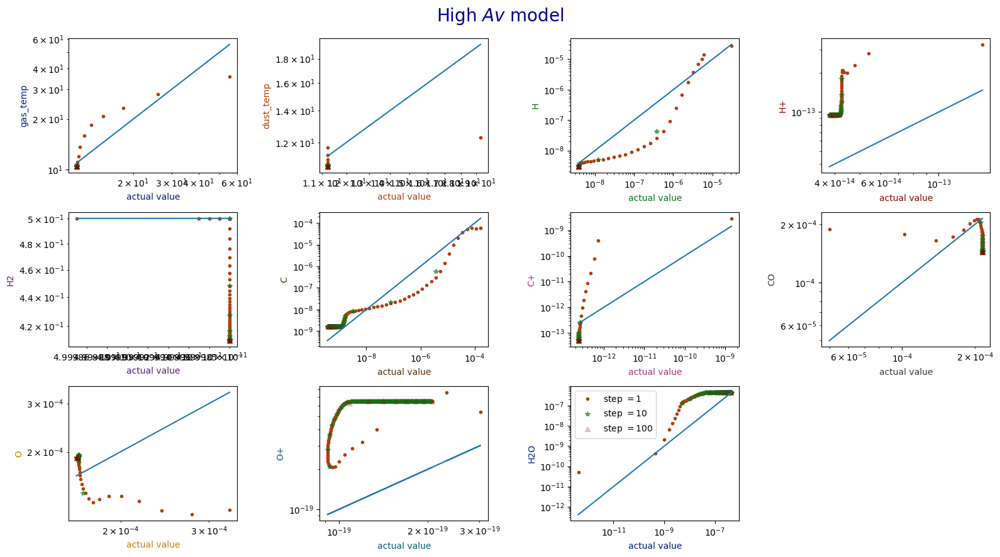

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
#fig,ax=plt.subplots(figsize=(25,12))
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(real_1[1][plot_specs[j]],predicted_1[1][plot_specs[j]],'.',
            color=colors[1],label='step $=1$')
    ax.plot(real_10[1][plot_specs[j]],predicted_10[1][plot_specs[j]],'*',
            color=colors[2], alpha=0.6, label='step $=10$')
    ax.plot(real_100[1][plot_specs[j]],predicted_100[1][plot_specs[j]],'^',
            color=colors[3], alpha=0.2, label='step $=100$')
    ax.plot(real_1[1][plot_specs[j]],real_1[1][plot_specs[j]])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('High $Av$ model', fontsize=20, color='darkblue')
ax.legend()

axes[-1].remove()

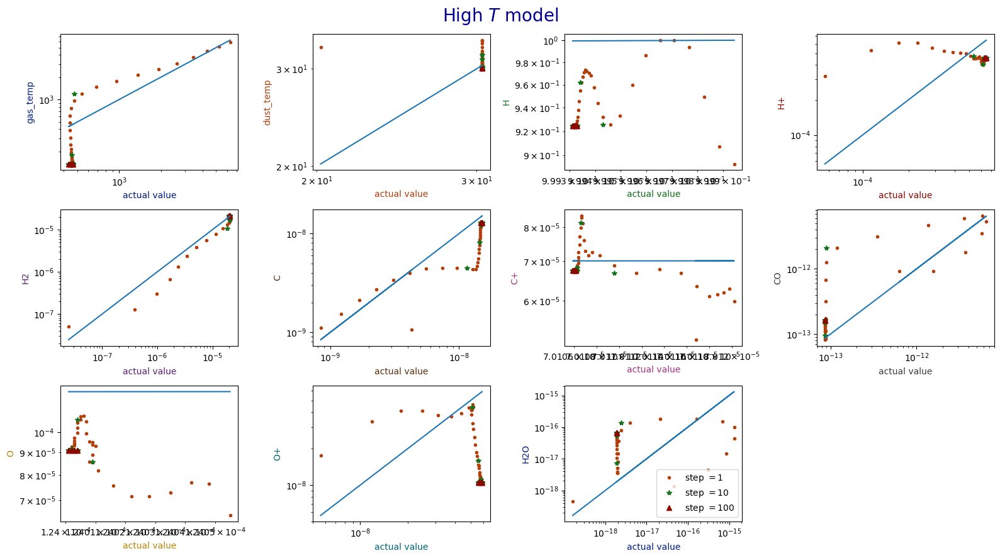

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
#fig,ax=plt.subplots(figsize=(25,12))
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(real_1[2][plot_specs[j]],predicted_1[2][plot_specs[j]],'.',
            color=colors[1],label='step $=1$')
    ax.plot(real_10[2][plot_specs[j]],predicted_10[2][plot_specs[j]],'*',
            color=colors[2], label='step $=10$')
    ax.plot(real_100[2][plot_specs[j]],predicted_100[2][plot_specs[j]],'^',
            color=colors[3],label='step $=100$')
    ax.plot(real_1[2][plot_specs[j]],real_1[2][plot_specs[j]])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('High $T$ model', fontsize=20, color='darkblue')
ax.legend()

axes[-1].remove()

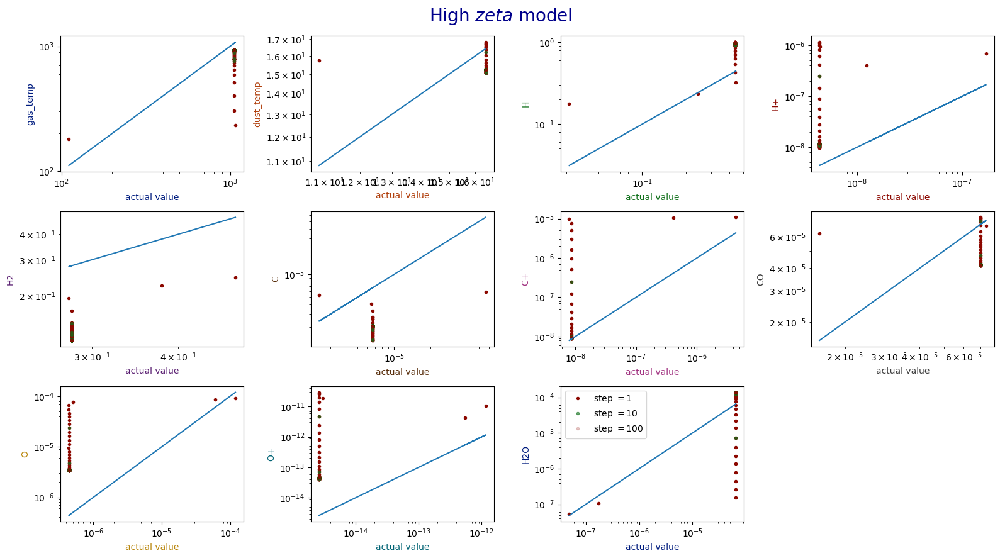

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
#fig,ax=plt.subplots(figsize=(25,12))
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(real_1[3][plot_specs[j]],predicted_1[3][plot_specs[j]],'.',
            color=colors[3],label='step $=1$')
    ax.plot(real_10[3][plot_specs[j]],predicted_10[3][plot_specs[j]],'.',
            color=colors[2], alpha=0.6, label='step $=10$')
    ax.plot(real_100[3][plot_specs[j]],predicted_100[3][plot_specs[j]],'.',
            color=colors[3], alpha=0.2, label='step $=100$')
    ax.plot(real_1[3][plot_specs[j]],real_1[3][plot_specs[j]])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('High $zeta$ model', fontsize=20, color='darkblue')
ax.legend()

axes[-1].remove()

# The same time-step but different models

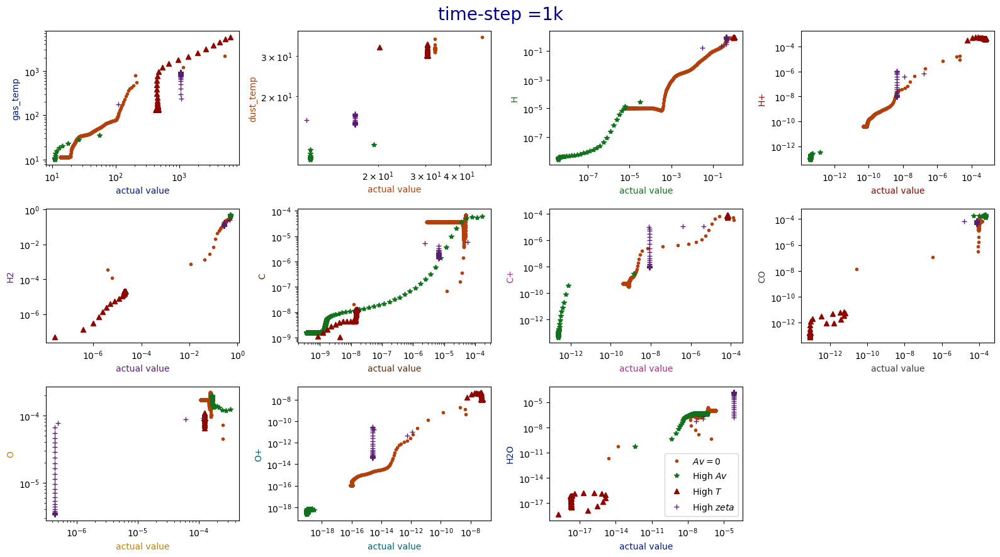

In [ ]:
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(real_1[0][plot_specs[j]],predicted_1[0][plot_specs[j]],'.',
            color=colors[1],label='$Av = 0$')
    ax.plot(real_1[1][plot_specs[j]],predicted_1[1][plot_specs[j]],'*',
            color=colors[2], label='High $Av$')
    ax.plot(real_1[2][plot_specs[j]],predicted_1[2][plot_specs[j]],'^',
            color=colors[3], label='High $T$')
    ax.plot(real_1[3][plot_specs[j]],predicted_1[3][plot_specs[j]],'+',
            color=colors[4], label='High $zeta$')

#     bottom_real=[real_10[0][plot_specs[j]],real_10[1][plot_specs[j]],
#             real_10[2][plot_specs[j]],real_10[3][plot_specs[j]]]
#     bottom_pred=[predicted_10[0][plot_specs[j]],predicted_10[1][plot_specs[j]],
#             predicted_10[2][plot_specs[j]],predicted_10[3][plot_specs[j]]]
#     ax.plot([np.min(bottom_real),np.min(bottom_pred)],[np.max(bottom_real),np.max(bottom_pred)])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('time-step =1k', fontsize=20, color='darkblue')
ax.legend()

axes[-1].remove()

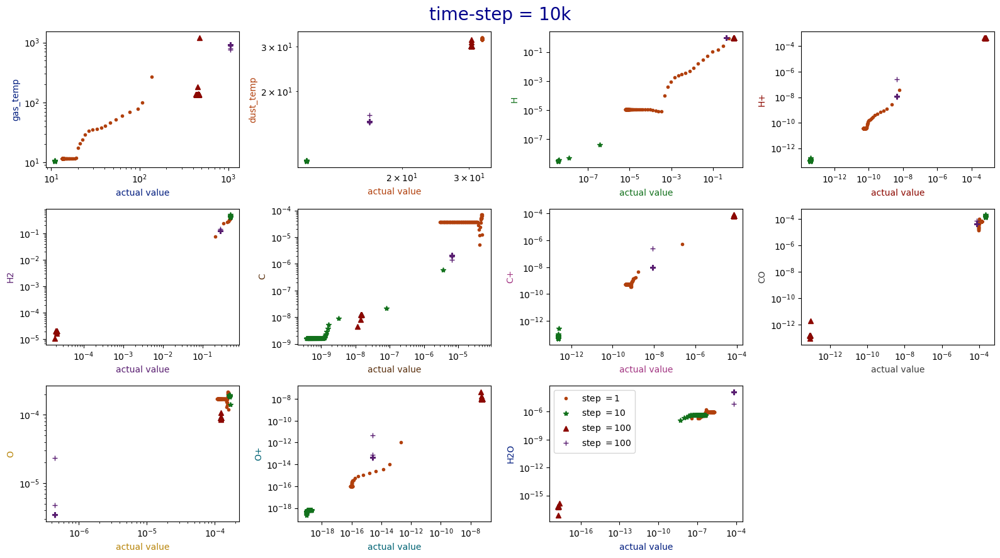

In [ ]:
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(real_10[0][plot_specs[j]],predicted_10[0][plot_specs[j]],'.',
            color=colors[1],label='step $=1$')
    ax.plot(real_10[1][plot_specs[j]],predicted_10[1][plot_specs[j]],'*',
            color=colors[2], label='step $=10$')
    ax.plot(real_10[2][plot_specs[j]],predicted_10[2][plot_specs[j]],'^',
            color=colors[3], label='step $=100$')
    ax.plot(real_10[3][plot_specs[j]],predicted_10[3][plot_specs[j]],'+',
            color=colors[4], label='step $=100$')

#     bottom_real=[real_10[0][plot_specs[j]],real_10[1][plot_specs[j]],
#             real_10[2][plot_specs[j]],real_10[3][plot_specs[j]]]
#     bottom_pred=[predicted_10[0][plot_specs[j]],predicted_10[1][plot_specs[j]],
#             predicted_10[2][plot_specs[j]],predicted_10[3][plot_specs[j]]]
#     ax.plot([np.min(bottom_real),np.min(bottom_pred)],[np.max(bottom_real),np.max(bottom_pred)])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('time-step = 10k', fontsize=20, color='darkblue')
ax.legend()

axes[-1].remove()

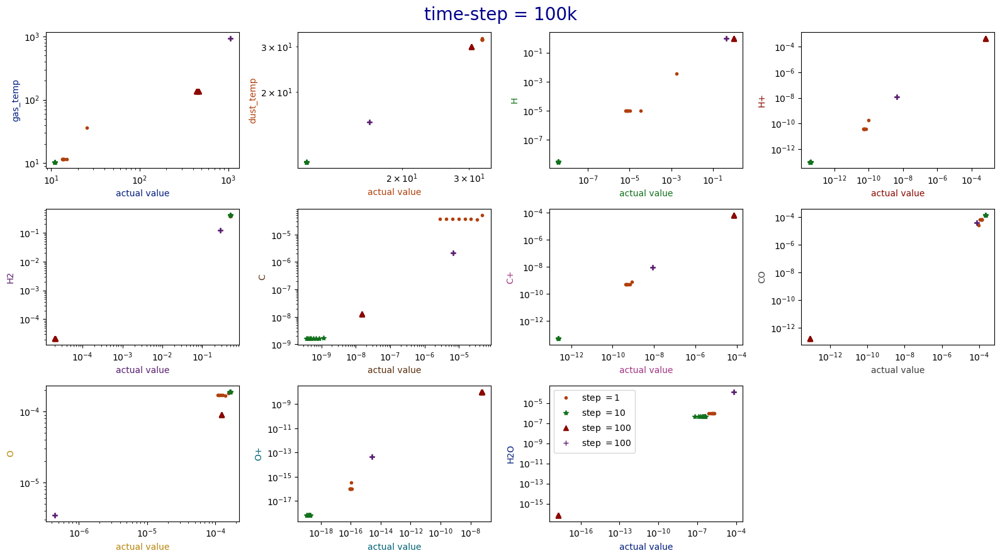

In [ ]:
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(real_100[0][plot_specs[j]],predicted_100[0][plot_specs[j]],'.',
            color=colors[1],label='step $=1$')
    ax.plot(real_100[1][plot_specs[j]],predicted_100[1][plot_specs[j]],'*',
            color=colors[2], label='step $=10$')
    ax.plot(real_100[2][plot_specs[j]],predicted_100[2][plot_specs[j]],'^',
            color=colors[3], label='step $=100$')
    ax.plot(real_100[3][plot_specs[j]],predicted_100[3][plot_specs[j]],'+',
            color=colors[4], label='step $=100$')

#     bottom_real=[real_10[0][plot_specs[j]],real_10[1][plot_specs[j]],
#             real_10[2][plot_specs[j]],real_10[3][plot_specs[j]]]
#     bottom_pred=[predicted_10[0][plot_specs[j]],predicted_10[1][plot_specs[j]],
#             predicted_10[2][plot_specs[j]],predicted_10[3][plot_specs[j]]]
#     ax.plot([np.min(bottom_real),np.min(bottom_pred)],[np.max(bottom_real),np.max(bottom_pred)])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('time-step = 100k', fontsize=20, color='darkblue')
ax.legend()

axes[-1].remove()

# Now lets take the median and the error bars


##### We can set ip the timestep

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
predicted_1=[]
predicted_10=[]
predicted_100=[]
for i in range(4):
    predicted_1.append(emulator.recover_real_values(pred_1[i])[plot_specs])
    predicted_10.append(emulator.recover_real_values(pred_10[i])[plot_specs])
    predicted_100.append(emulator.recover_real_values(pred_100[i])[plot_specs])

real_1=[]
for i in models:
    real_1.append(data.loc[i:i+steps_1-1][plot_specs])

#real_1=[] este ya está
real_10=[]
for i in models:
    v=[]
    for j in range(1,99):
        v.append(data.loc[round(i + 10*j):round(i + 10*j)][plot_specs])
        #v=pd.concat(v, axis=0)
    real_10.append(pd.concat(v, axis=0))

# real_100=[]
# for i in models:
#     v=[]
#     for j in range(8):
#         v.append(data.loc[round(i + 142.3*j):round(i + 142.3*j)])
#         #v=pd.concat(v, axis=0)
#     real_100.append(pd.concat(v, axis=0))

real_100=[]
for i in models:
    v=[]
    for j in range(1,9):
        v.append(data.loc[round(i + 124.75*j):round(i + 124.75*j)][plot_specs])
        #v=pd.concat(v, axis=0)
    real_100.append(pd.concat(v, axis=0))



In [ ]:
#1k timestep,AV=0
pred_av0_1=predicted_1[0].to_numpy() #1 timestep
real_av0_1=real_1[0].to_numpy()

#10k timestep,AV=0
pred_av0_10=predicted_10[0].to_numpy()
real_av0_10=real_10[0].to_numpy()

#100k timestep,AV=0
pred_av0_100=predicted_100[0].to_numpy()
real_av0_100=real_100[0].to_numpy()

#####################################
#1k timestep, High AV
pred_hav_1=predicted_1[1].to_numpy() #1 timestep
real_hav_1=real_1[1].to_numpy()

#10k timestep, High AV
pred_hav_10=predicted_10[1].to_numpy()
real_hav_10=real_10[1].to_numpy()

#100k timestep, High AV
pred_hav_100=predicted_100[1].to_numpy()
real_hav_100=real_100[1].to_numpy()
###########################################
#1k timestep, High T
pred_ht_1=predicted_1[2].to_numpy() #1 timestep
real_ht_1=real_1[2].to_numpy()

#10k timestep, High T
pred_ht_10=predicted_10[2].to_numpy()
real_ht_10=real_10[2].to_numpy()

#100k timestep, High T
pred_ht_100=predicted_100[2].to_numpy()
real_ht_100=real_100[2].to_numpy()
#################################################
#1k timestep, High z
pred_hz_1=predicted_1[3].to_numpy() #1 timestep
real_hz_1=real_1[3].to_numpy()

#10k timestep, High z
pred_hz_10=predicted_10[3].to_numpy()
real_hz_10=real_10[3].to_numpy()

#100k timestep, High z
pred_hz_100=predicted_100[3].to_numpy()
real_hz_100=real_100[3].to_numpy()

###### now we can take the medians

In [ ]:
real_av0_1

array([[5208.7, 48.54, 0.999967, ..., 0.00024867, 4.67387e-09,
        2.54104e-15],
       [1154.8, 32.47, 0.999972, ..., 0.000248355, 4.31033e-09,
        1.52877e-14],
       [204.89, 32.47, 0.977366, ..., 0.000164217, 1.90415e-09,
        8.12142e-07],
       ...,
       [13.99, 32.47, 6.4525099999999995e-06, ..., 0.000108979,
        1.18181e-16, 1.96819e-06],
       [13.99, 32.47, 6.45049e-06, ..., 0.000108967, 1.18331e-16,
        1.96922e-06],
       [14.0, 32.47, 6.44847e-06, ..., 0.000108955,
        1.1848100000000002e-16, 1.97024e-06]], dtype=object)

In [ ]:
med_real_av0_1, med_real_hav_1, med_real_ht_1, med_real_hz_1=[],[],[],[]

med_pred_av0_1, med_pred_hav_1, med_pred_ht_1, med_pred_hz_1=[],[],[],[]


stdup_av0_1,stdup_hav_1, stdup_ht_1, stdup_hz_1=[],[],[],[]
stdlow_av0_1,stdlow_hav_1, stdlow_ht_1, stdlow_hz_1=[],[],[],[]

for spec in range(11):
    #print(real_av0_1[:,spec])
    rav0=np.sort(real_av0_1[:,spec])
    rhav=np.sort(real_hav_1[:,spec])
    rht=np.sort(real_ht_1[:,spec])
    rhz=np.sort(real_hz_1[:,spec])
    #p=predicted[:,spec]
    i_av0, i_hav, i_ht, i_hz=[],[],[],[]

    for i in rav0:
        i_av0.append(np.where(real_av0_1[:,spec]==i)[0][0])
    pav0=pred_av0_1[:,spec][i_av0]

    for i in rhav:
        i_hav.append(np.where(real_hav_1[:,spec]==i)[0][0])
    phav=pred_hav_1[:,spec][i_hav]

    for i in rht:
        i_ht.append(np.where(real_ht_1[:,spec]==i)[0][0])
    pht=pred_ht_1[:,spec][i_ht]

    for i in rhz:
        i_hz.append(np.where(real_hz_1[:,spec]==i)[0][0])
    phz=pred_hz_1[:,spec][i_hz]

    rav0_med, rhav_med, rht_med, rhz_med=[],[],[],[]
    pav0_med, phav_med, pht_med, phz_med=[],[],[],[]

    sav0_up,shav_up,sht_up,shz_up=[],[],[],[]
    sav0_low,shav_low,sht_low,shz_low=[],[],[],[]

    for k in range(45): #multiplo de 22, 45*22=990 num de elementos para este paso
        #print(rav0[k*22:(k+1)*22])
        rav0_med.append(np.percentile(rav0[k*22:(k+1)*22],50))
        rhav_med.append(np.percentile(rhav[k*22:(k+1)*22],50))
        rht_med.append(np.percentile(rht[k*22:(k+1)*22],50))
        rhz_med.append(np.percentile(rhz[k*22:(k+1)*22],50))

        pav0_med.append( np.percentile(pav0[k*22:(k+1)*22],50)  )
        phav_med.append( np.percentile(phav[k*22:(k+1)*22],50)  )
        pht_med.append( np.percentile(pht[k*22:(k+1)*22],50)  )
        phz_med.append( np.percentile(phz[k*22:(k+1)*22],50)  )

        sav0_up.append( np.percentile(pav0[k*22:(k+1)*22],90)  )
        shav_up.append( np.percentile(phav[k*22:(k+1)*22],90)  )
        sht_up.append( np.percentile(pht[k*22:(k+1)*22],90)  )
        shz_up.append( np.percentile(phz[k*22:(k+1)*22],90)  )

        sav0_low.append( np.percentile(pav0[k*22:(k+1)*22],10)  )
        shav_low.append( np.percentile(phav[k*22:(k+1)*22],10)  )
        sht_low.append( np.percentile(pht[k*22:(k+1)*22],10)  )
        shz_low.append( np.percentile(phz[k*22:(k+1)*22],10)  )

    med_real_av0_1.append(rav0_med)
    med_real_hav_1.append(rhav_med)
    med_real_ht_1.append(rht_med)
    med_real_hz_1.append(rhz_med)

    med_pred_av0_1.append(pav0_med)
    med_pred_hav_1.append(phav_med)
    med_pred_ht_1.append(pht_med)
    med_pred_hz_1.append(phz_med)

    stdlow_av0_1.append(sav0_low)
    stdlow_hav_1.append(shav_low)
    stdlow_ht_1.append(sht_low)
    stdlow_hz_1.append(shz_low)

    stdup_av0_1.append(sav0_up)
    stdup_hav_1.append(shav_up)
    stdup_ht_1.append(sht_up)
    stdup_hz_1.append(shz_up)

In [ ]:
medianas_real_av0_1=np.log10(np.array(med_real_av0_1))
medianas_real_hav_1=np.log10(np.array(med_real_hav_1))
medianas_real_ht_1=np.log10(np.array(med_real_ht_1))
medianas_real_hz_1=np.log10(np.array(med_real_hz_1))

med_pred_av0_1=np.log10(med_pred_av0_1)
med_pred_hav_1=np.log10(med_pred_hav_1)
med_pred_ht_1=np.log10(med_pred_ht_1)
med_pred_hz_1=np.log10(med_pred_hz_1)

stdlow_av0_1=np.log10(np.array(stdlow_av0_1))
stdlow_hav_1=np.log10(np.array(stdlow_hav_1))
stdlow_ht_1=np.log10(np.array(stdlow_ht_1))
stdlow_hz_1=np.log10(np.array(stdlow_hz_1))

stdup_av0_1=np.log10(np.array(stdup_av0_1))
stdup_hav_1=np.log10(np.array(stdup_hav_1))
stdup_ht_1=np.log10(np.array(stdup_ht_1))
stdup_hz_1=np.log10(np.array(stdup_hz_1))

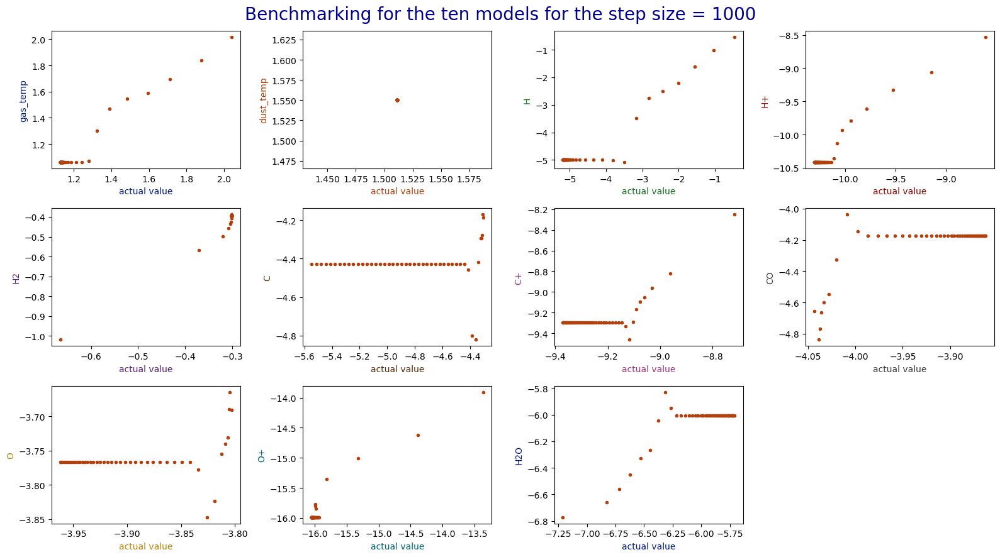

In [ ]:
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()


j=0
for i,ax in enumerate(axes[:-1]):
    #x=np.log10(real[plot_specs[j]].values)
    #y=np.log10(predicted[plot_specs[j]].values)
    #ax.plot(x,y,'.', color=colors[j])
    #ax.plot(real[plot_specs[j]],real[plot_specs[j]])

    ax.plot(medianas_real_av0_1[i],med_pred_av0_1[i],'.', color=colors[1])
    #ax.plot(medianas_real_av0_10[i],med_pred_av0_10[i],'.', color=colors[2])
    #ax.plot(medianas_real_av0_100[i],med_pred_av0_100[i],'.', color=colors[3])
    #ax.plot(medianas_real_hz_1[i],med_pred_hz_1[i],'.-', color=colors[4])
    #ax.fill_between(medianas_real1[i], medianas_pred1[i]-std1_low[i],
                    #medianas_pred1[i]+std1_up[i], alpha=0.3, color='green')
    #ax.fill_between(medianas_real1[i], std1_low[i], std1_up[i], alpha=0.3,color='green')
    #ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
    j=j+1
fig.suptitle('Benchmarking for the ten models for the step size = 1000', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

siguiente paso 10

In [ ]:
len(real_av0_10)

98

In [ ]:
med_real_av0_10, med_real_hav_10, med_real_ht_10, med_real_hz_10=[],[],[],[]

med_pred_av0_10, med_pred_hav_10, med_pred_ht_10, med_pred_hz_10=[],[],[],[]


stdup_av0_10,stdup_hav_10, stdup_ht_10, stdup_hz_10=[],[],[],[]
stdlow_av0_10,stdlow_hav_10, stdlow_ht_10, stdlow_hz_10=[],[],[],[]

for spec in range(11):
    #print(real_av0_1[:,spec])
    rav0=np.sort(real_av0_10[:,spec])
    rhav=np.sort(real_hav_10[:,spec])
    rht=np.sort(real_ht_10[:,spec])
    rhz=np.sort(real_hz_10[:,spec])
    #p=predicted[:,spec]
    i_av0, i_hav, i_ht, i_hz=[],[],[],[]

    for i in rav0:
        i_av0.append(np.where(real_av0_10[:,spec]==i)[0][0])
    pav0=pred_av0_10[:,spec][i_av0]

    for i in rhav:
        i_hav.append(np.where(real_hav_10[:,spec]==i)[0][0])
    phav=pred_hav_10[:,spec][i_hav]

    for i in rht:
        i_ht.append(np.where(real_ht_10[:,spec]==i)[0][0])
    pht=pred_ht_10[:,spec][i_ht]

    for i in rhz:
        i_hz.append(np.where(real_hz_10[:,spec]==i)[0][0])
    phz=pred_hz_10[:,spec][i_hz]

    rav0_med, rhav_med, rht_med, rhz_med=[],[],[],[]
    pav0_med, phav_med, pht_med, phz_med=[],[],[],[]

    sav0_up,shav_up,sht_up,shz_up=[],[],[],[]
    sav0_low,shav_low,sht_low,shz_low=[],[],[],[]

    for k in range(12): #multiplo de 8, 45*8=990 num de elementos para este paso
        #print(rav0[k*8:(k+1)*8])
        rav0_med.append(np.percentile(rav0[k*8:(k+1)*8],50))
        rhav_med.append(np.percentile(rhav[k*8:(k+1)*8],50))
        rht_med.append(np.percentile(rht[k*8:(k+1)*8],50))
        rhz_med.append(np.percentile(rhz[k*8:(k+1)*8],50))

        pav0_med.append( np.percentile(pav0[k*8:(k+1)*8],50)  )
        phav_med.append( np.percentile(phav[k*8:(k+1)*8],50)  )
        pht_med.append( np.percentile(pht[k*8:(k+1)*8],50)  )
        phz_med.append( np.percentile(phz[k*8:(k+1)*8],50)  )

        sav0_up.append( np.percentile(pav0[k*8:(k+1)*8],90)  )
        shav_up.append( np.percentile(phav[k*8:(k+1)*8],90)  )
        sht_up.append( np.percentile(pht[k*8:(k+1)*8],90)  )
        shz_up.append( np.percentile(phz[k*8:(k+1)*8],90)  )

        sav0_low.append( np.percentile(pav0[k*8:(k+1)*8],10)  )
        shav_low.append( np.percentile(phav[k*8:(k+1)*8],10)  )
        sht_low.append( np.percentile(pht[k*8:(k+1)*8],10)  )
        shz_low.append( np.percentile(phz[k*8:(k+1)*8],10)  )

    med_real_av0_10.append(rav0_med)
    med_real_hav_10.append(rhav_med)
    med_real_ht_10.append(rht_med)
    med_real_hz_10.append(rhz_med)

    med_pred_av0_10.append(pav0_med)
    med_pred_hav_10.append(phav_med)
    med_pred_ht_10.append(pht_med)
    med_pred_hz_10.append(phz_med)

    stdlow_av0_10.append(sav0_low)
    stdlow_hav_10.append(shav_low)
    stdlow_ht_10.append(sht_low)
    stdlow_hz_10.append(shz_low)

    stdup_av0_10.append(sav0_up)
    stdup_hav_10.append(shav_up)
    stdup_ht_10.append(sht_up)
    stdup_hz_10.append(shz_up)

In [ ]:
medianas_real_av0_10=np.log10(np.array(med_real_av0_10))
medianas_real_hav_10=np.log10(np.array(med_real_hav_10))
medianas_real_ht_10=np.log10(np.array(med_real_ht_10))
medianas_real_hz_10=np.log10(np.array(med_real_hz_10))

med_pred_av0_10=np.log10(med_pred_av0_10)
med_pred_hav_10=np.log10(med_pred_hav_10)
med_pred_ht_10=np.log10(med_pred_ht_10)
med_pred_hz_10=np.log10(med_pred_hz_10)

stdlow_av0_10=np.log10(np.array(stdlow_av0_10))
stdlow_hav_10=np.log10(np.array(stdlow_hav_10))
stdlow_ht_10=np.log10(np.array(stdlow_ht_10))
stdlow_hz_10=np.log10(np.array(stdlow_hz_10))

stdup_av0_10=np.log10(np.array(stdup_av0_10))
stdup_hav_10=np.log10(np.array(stdup_hav_10))
stdup_ht_10=np.log10(np.array(stdup_ht_10))
stdup_hz_10=np.log10(np.array(stdup_hz_10))

Ahora el paso de 100k

In [ ]:
len(real_av0_100)

8

In [ ]:
med_real_av0_100, med_real_hav_100, med_real_ht_100, med_real_hz_100=[],[],[],[]

med_pred_av0_100, med_pred_hav_100, med_pred_ht_100, med_pred_hz_100=[],[],[],[]


stdup_av0_100,stdup_hav_100, stdup_ht_100, stdup_hz_100=[],[],[],[]
stdlow_av0_100,stdlow_hav_100, stdlow_ht_100, stdlow_hz_100=[],[],[],[]

for spec in range(11):
    #print(real_av0_1[:,spec])
    rav0=np.sort(real_av0_100[:,spec])
    rhav=np.sort(real_hav_100[:,spec])
    rht=np.sort(real_ht_100[:,spec])
    rhz=np.sort(real_hz_100[:,spec])
    #p=predicted[:,spec]
    i_av0, i_hav, i_ht, i_hz=[],[],[],[]

    for i in rav0:
        i_av0.append(np.where(real_av0_100[:,spec]==i)[0][0])
    pav0=pred_av0_100[:,spec][i_av0]

    for i in rhav:
        i_hav.append(np.where(real_hav_100[:,spec]==i)[0][0])
    phav=pred_hav_100[:,spec][i_hav]

    for i in rht:
        i_ht.append(np.where(real_ht_100[:,spec]==i)[0][0])
    pht=pred_ht_100[:,spec][i_ht]

    for i in rhz:
        i_hz.append(np.where(real_hz_100[:,spec]==i)[0][0])
    phz=pred_hz_100[:,spec][i_hz]

    rav0_med, rhav_med, rht_med, rhz_med=[],[],[],[]
    pav0_med, phav_med, pht_med, phz_med=[],[],[],[]

    sav0_up,shav_up,sht_up,shz_up=[],[],[],[]
    sav0_low,shav_low,sht_low,shz_low=[],[],[],[]
    sav0, shav, sht, shz=[],[],[],[]
    for k in range(8): #multiplo de 8, 45*8=990 num de elementos para este paso
        #print(rav0[k*8:(k+1)*8])
        rav0_med.append(np.percentile(rav0[k:(k+1)],50))
        rhav_med.append(np.percentile(rhav[k:(k+1)],50))
        rht_med.append(np.percentile(rht[k:(k+1)],50))
        rhz_med.append(np.percentile(rhz[k:(k+1)],50))

        pav0_med.append( np.percentile(pav0[k:(k+1)],50)  )
        phav_med.append( np.percentile(phav[k:(k+1)],50)  )
        pht_med.append( np.percentile(pht[k:(k+1)],50)  )
        phz_med.append( np.percentile(phz[k:(k+1)],50)  )

#         sav0_up.append( np.percentile(pav0[k:(k+1)],90)  )
#         shav_up.append( np.percentile(phav[k:(k+1)],90)  )
#         sht_up.append( np.percentile(pht[k:(k+1)],90)  )
#         shz_up.append( np.percentile(phz[k:(k+1)],90)  )

#         sav0_low.append( np.percentile(pav0[k:(k+1)],10)  )
#         shav_low.append( np.percentile(phav[k:(k+1)],10)  )
#         sht_low.append( np.percentile(pht[k:(k+1)],10)  )
#         shz_low.append( np.percentile(phz[k:(k+1)],10)  )
        standarav0=np.sum(( np.log10(pav0[k:(k+1)])-np.log10(np.mean(rav0[k:(k+1)])) )**2)
        sav0.append(np.sqrt(standarav0/1))
        standarhav=np.sum(( np.log10(phav[k:(k+1)])-np.log10(np.mean(rhav[k:(k+1)])) )**2)
        shav.append(np.sqrt(standarhav/1))
        standarht=np.sum(( np.log10(pht[k:(k+1)])-np.log10(np.mean(rht[k:(k+1)])) )**2)
        sht.append(np.sqrt(standarht/1))
        standarhz=np.sum(( np.log10(phz[k:(k+1)])-np.log10(np.mean(rhz[k:(k+1)])) )**2)
        shz.append(np.sqrt(standarhz/1))


    med_real_av0_100.append(rav0_med)
    med_real_hav_100.append(rhav_med)
    med_real_ht_100.append(rht_med)
    med_real_hz_100.append(rhz_med)

    med_pred_av0_100.append(pav0_med)
    med_pred_hav_100.append(phav_med)
    med_pred_ht_100.append(pht_med)
    med_pred_hz_100.append(phz_med)

    stdlow_av0_100.append(sav0_low)
    stdlow_hav_100.append(shav_low)
    stdlow_ht_100.append(sht_low)
    stdlow_hz_100.append(shz_low)

#     stdup_av0_100.append(sav0_up)
#     stdup_hav_100.append(shav_up)
#     stdup_ht_100.append(sht_up)
#     stdup_hz_100.append(shz_up)
    stdup_av0_100.append(sav0)
    stdup_hav_100.append(shav)
    stdup_ht_100.append(sht)
    stdup_hz_100.append(shz)

In [ ]:
medianas_real_av0_100=np.log10(np.array(med_real_av0_100))
medianas_real_hav_100=np.log10(np.array(med_real_hav_100))
medianas_real_ht_100=np.log10(np.array(med_real_ht_100))
medianas_real_hz_100=np.log10(np.array(med_real_hz_100))

med_pred_av0_100=np.log10(med_pred_av0_100)
med_pred_hav_100=np.log10(med_pred_hav_100)
med_pred_ht_100=np.log10(med_pred_ht_100)
med_pred_hz_100=np.log10(med_pred_hz_100)

# stdlow_av0_100=np.log10(np.array(stdlow_av0_100))
# stdlow_hav_100=np.log10(np.array(stdlow_hav_100))
# stdlow_ht_100=np.log10(np.array(stdlow_ht_100))
# stdlow_hz_100=np.log10(np.array(stdlow_hz_100))

# stdup_av0_100=np.log10(np.array(stdup_av0_100))
# stdup_hav_100=np.log10(np.array(stdup_hav_100))
# stdup_ht_100=np.log10(np.array(stdup_ht_100))
# stdup_hz_100=np.log10(np.array(stdup_hz_100))

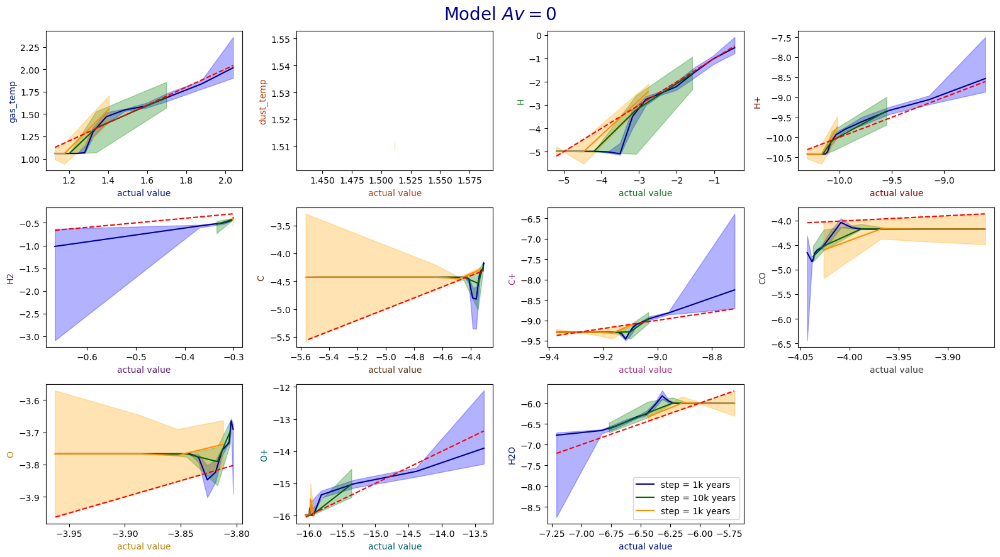

In [ ]:
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()


j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(medianas_real_av0_1[i],med_pred_av0_1[i], color='darkblue', label='step = 1k years')
    ax.fill_between(medianas_real_av0_1[i], stdlow_av0_1[i],
                    stdup_av0_1[i], alpha=0.3, color='blue')

    ax.plot(medianas_real_av0_10[i],med_pred_av0_10[i], color='darkgreen',label='step = 10k years')
    ax.fill_between(medianas_real_av0_10[i], stdlow_av0_10[i],
                    stdup_av0_10[i], alpha=0.3, color='green',)

    ax.plot(medianas_real_av0_100[i],med_pred_av0_100[i], color='darkorange',label='step = 1k years')
    ax.fill_between(medianas_real_av0_100[i], med_pred_av0_100[i] + stdup_av0_100[i],
                    med_pred_av0_100[i] - stdup_av0_100[i], alpha=0.3, color='orange')

    ax.plot(medianas_real_av0_1[i],medianas_real_av0_1[i],'--' ,color='red')
    #ax.fill_between(medianas_real1[i], std1_low[i], std1_up[i], alpha=0.3,color='green')
    #ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
    j=j+1
fig.suptitle('Model $Av=0$', fontsize=20, color='darkblue')
ax.legend(loc='lower right')

axes[-1].remove()

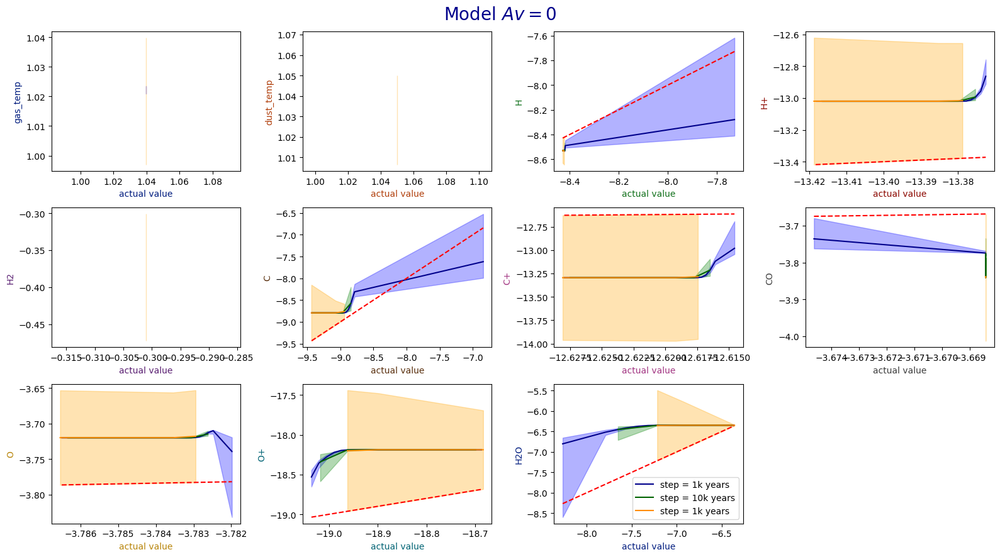

In [ ]:
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()


j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(medianas_real_hav_1[i],med_pred_hav_1[i], color='darkblue', label='step = 1k years')
    ax.fill_between(medianas_real_hav_1[i], stdlow_hav_1[i],
                    stdup_hav_1[i], alpha=0.3, color='blue')

    ax.plot(medianas_real_hav_10[i],med_pred_hav_10[i], color='darkgreen',label='step = 10k years')
    ax.fill_between(medianas_real_hav_10[i], stdlow_hav_10[i],
                    stdup_hav_10[i], alpha=0.3, color='green',)

    ax.plot(medianas_real_hav_100[i],med_pred_hav_100[i], color='darkorange',label='step = 1k years')
    ax.fill_between(medianas_real_hav_100[i], med_pred_hav_100[i] + stdup_hav_100[i],
                    med_pred_hav_100[i] - stdup_hav_100[i], alpha=0.3, color='orange')

    ax.plot(medianas_real_hav_1[i],medianas_real_hav_1[i],'--' ,color='red')
    #ax.fill_between(medianas_real1[i], std1_low[i], std1_up[i], alpha=0.3,color='green')
    #ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
    j=j+1
fig.suptitle('Model high $A_v$', fontsize=20, color='darkblue')
ax.legend(loc='lower right')

axes[-1].remove()

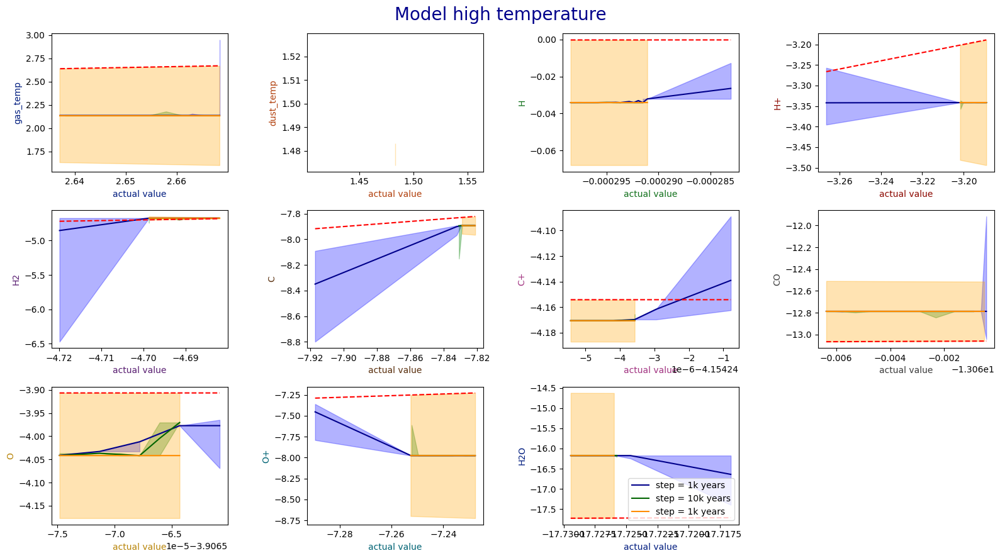

In [ ]:
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()


j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(medianas_real_ht_1[i],med_pred_ht_1[i], color='darkblue', label='step = 1k years')
    ax.fill_between(medianas_real_ht_1[i], stdlow_ht_1[i],
                    stdup_ht_1[i], alpha=0.3, color='blue')

    ax.plot(medianas_real_ht_10[i],med_pred_ht_10[i], color='darkgreen',label='step = 10k years')
    ax.fill_between(medianas_real_ht_10[i], stdlow_ht_10[i],
                    stdup_ht_10[i], alpha=0.3, color='green',)

    ax.plot(medianas_real_ht_100[i],med_pred_ht_100[i], color='darkorange',label='step = 1k years')
    ax.fill_between(medianas_real_ht_100[i], med_pred_ht_100[i] + stdup_ht_100[i],
                    med_pred_ht_100[i] - stdup_ht_100[i], alpha=0.3, color='orange')

    ax.plot(medianas_real_ht_1[i],medianas_real_ht_1[i],'--' ,color='red')
    #ax.fill_between(medianas_real1[i], std1_low[i], std1_up[i], alpha=0.3,color='green')
    #ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
    j=j+1
fig.suptitle('Model high temperature', fontsize=20, color='darkblue')
ax.legend(loc='lower right')

axes[-1].remove()

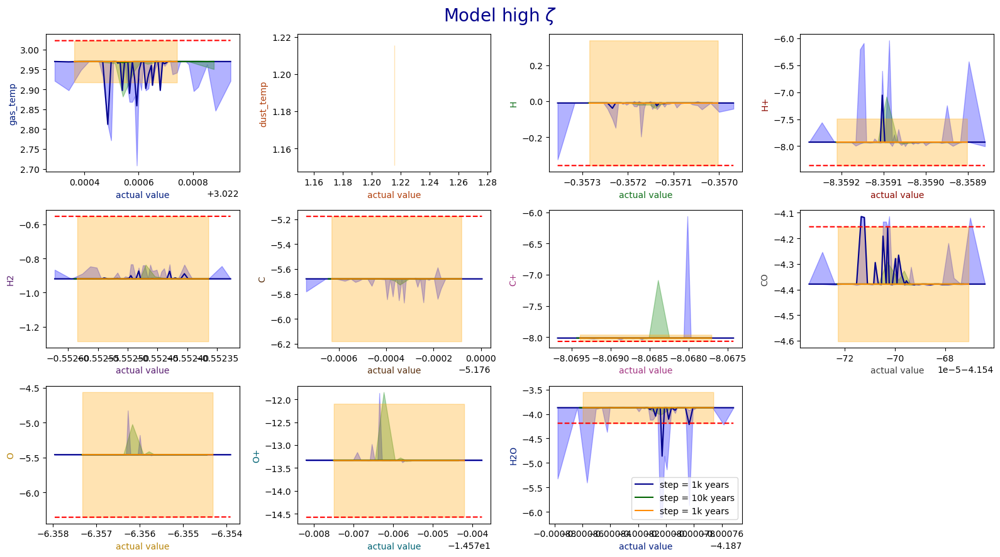

In [ ]:
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()


j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(medianas_real_hz_1[i],med_pred_hz_1[i], color='darkblue', label='step = 1k years')
    ax.fill_between(medianas_real_hz_1[i], stdlow_hz_1[i],
                    stdup_hz_1[i], alpha=0.3, color='blue')

    ax.plot(medianas_real_hz_10[i],med_pred_hz_10[i], color='darkgreen',label='step = 10k years')
    ax.fill_between(medianas_real_hz_10[i], stdlow_hz_10[i],
                    stdup_hz_10[i], alpha=0.3, color='green',)

    ax.plot(medianas_real_hz_100[i],med_pred_hz_100[i], color='darkorange',label='step = 1k years')
    ax.fill_between(medianas_real_hz_100[i], med_pred_hz_100[i] + stdup_hz_100[i],
                    med_pred_hz_100[i] - stdup_hz_100[i], alpha=0.3, color='orange')

    ax.plot(medianas_real_hz_1[i],medianas_real_hz_1[i],'--' ,color='red')
    #ax.fill_between(medianas_real1[i], std1_low[i], std1_up[i], alpha=0.3,color='green')
    #ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
    j=j+1
fig.suptitle('Model high $\zeta$', fontsize=20, color='darkblue')
ax.legend(loc='lower right')

axes[-1].remove()

In [ ]:
#Now we return to the real space
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
Av0=[]
High_Av=[]
High_T=[]
High_zeta=[]
for i in range(4):
    for j in range(3):
        if i==0: Av0.append(emulator.recover_real_values(predictions[i][j])[plot_specs])
        if i==1: High_Av.append(emulator.recover_real_values(predictions[i][j])[plot_specs])
        if i==2: High_T.append(emulator.recover_real_values(predictions[i][j])[plot_specs])
        if i==3: High_zeta.append(emulator.recover_real_values(predictions[i][j])[plot_specs])

ValueError: x and y must have same first dimension, but have shapes (999,) and (1,)

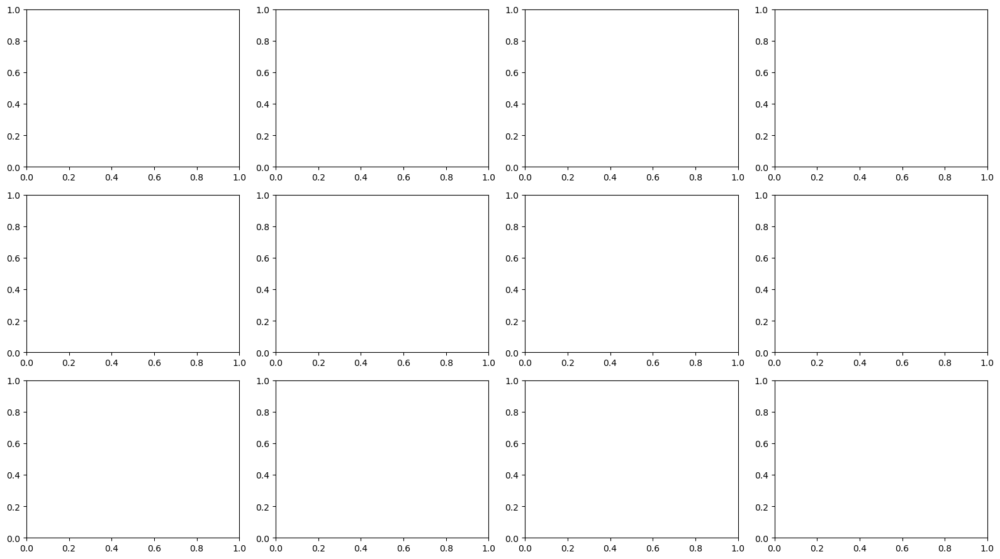

In [ ]:
data_av0=data.loc[j:j+steps_1]
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(data_av0[plot_specs[j]],Av0[1][plot_specs[j]],'.', color=colors[i])
    #ax.plot(data_av0[plot_specs[j]],Av0[1][plot_specs[j]],'.', color=colors[i])
    #ax.plot(data_av0[plot_specs[j]],Av0[2][plot_specs[j]],'.', color=colors[i])

    ax.plot(Av0[0][plot_specs[j]],Av0[0][plot_specs[j]])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('$Av=0$ model, step=1', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

In [ ]:
len(Av0[2])

1

In [ ]:
len(Av0[2])

1001

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
predicted_vals=[]
for i in range(8):
    predicted_vals.append(emulator.recover_real_values(predictions[i])[plot_specs])

In [ ]:
pred_av0 = predicted_vals[4]

ValueError: ignored

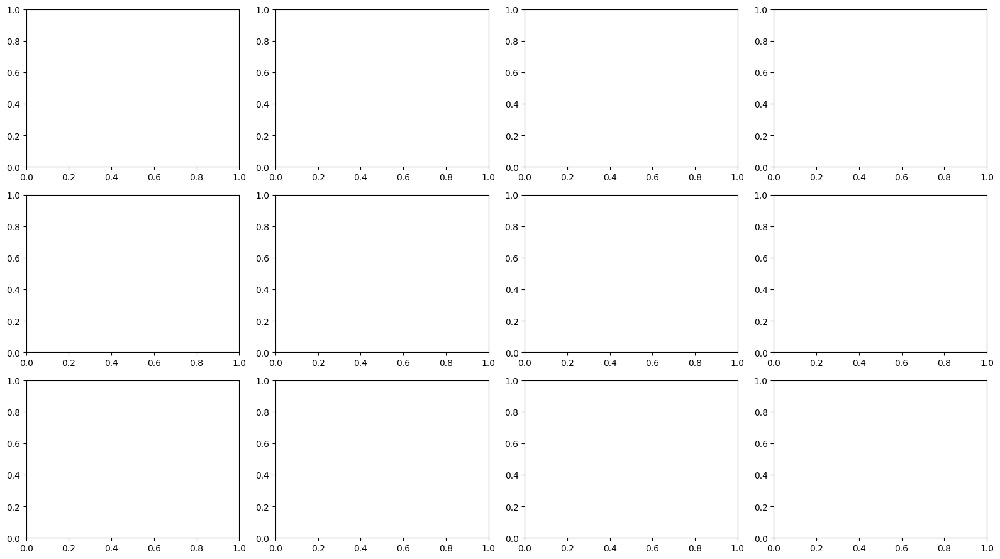

In [ ]:
plot_specs=["gas_temp","dust_temp","H","H+","H2","C","C+","CO","O","O+","H2O"]
#fig,ax=plt.subplots(figsize=(25,12))
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    ax.plot(data_av0[plot_specs[j]],pred_av0[plot_specs[j]],'.', color=colors[i])
    ax.plot(data_av0[plot_specs[j]],data_av0[plot_specs[j]])

    j=j+1
    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xscale="log",yscale="log",xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('$Av=0$ model, step=1', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

In [ ]:
steps=steps_100
for cond in init_cond:
    pred=pd.DataFrame() #The empty dataFrame to fill it up with the prediction o each model
    for step in range(steps):
        output = emulator.predict_multiple_timesteps(cond,500)
        pred=pred.append(output,sort=False) #esto evalua el modelo
        cond["gas_temp"]=output["gas_temp"]#estas dos, actualizan las condiciones por las actuales
        cond[emulator.chem_labels]=output[emulator.chem_labels]
    predictions.append(pred)

<ipython-input-31-5c254d4634c1>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
<ipython-input-31-5c254d4634c1>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
<ipython-input-31-5c254d4634c1>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo
<ipython-input-31-5c254d4634c1>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pred=pred.append(output,sort=False) #esto evalua el modelo


Now we have to compute the time_step 1000

In [ ]:
plot_df=pd.DataFrame()
plot_specs=["H","H+","H2","C","C+","CO","CH3OH","O","CH+","H2O","CO2","E-"]
plots=[0,1]+[i+2 for i in range(len(emulator.autoencoder.species)) if emulator.autoencoder.species[i] in plot_specs]
labels=["$log(T_g / K )$","$log(T_d / K )$"]+[f"log X({emulator.autoencoder.species[i-2]})"  for i in plots[2:] ]

for nsteps in [1000,100,1]:

    predict=emulator.recover_real_values(predicts[nsteps])
    predict=np.log10(predict).round(1)
    for i,idx in enumerate(plots):
        df=get_plot_df(reals[nsteps][:,idx],predict.values[:,idx])
        df["Quantity"]=labels[i]
        df["Nsteps"]=nsteps
        plot_df=plot_df.append(df)

In [ ]:
real.shape

In [ ]:
predicted.shape

In [ ]:
k=498
np.percentile(p[k*2:(k+1)*2],50)

In [ ]:
medianas_real=[]
medianas_pred=[]
std_up=[]
std_low=[]

for spec in range(11):
    r=np.sort(real[:,spec])
    #p=predicted[:,spec]
    index=[]
    for i in r:
        index.append(np.where(real[:,spec]==i)[0][0])
    p=predicted[:,spec][index]
    #Ahora r esta ordenado en forma ascendente y p esta ordenado de la misma manera
    r_med=[]
    p_med=[]
    s_up=[]
    s_low=[]
    for k in range(498):
        r_med.append(np.percentile(r[k*2:(k+1)*2],50))
        #p_med.append(np.median(p[k*2:(k+1)*2]))
        uper=np.percentile(np.log10(p[k*2:(k+1)*2]),90)
        m=np.percentile(p[k*2:(k+1)*2],50)
        lower=np.percentile(np.log10(p[k*2:(k+1)*2]),10)
        #standar=np.sum(( np.log2(p[k*2:(k+1)*2])-np.log2(np.mean(r[k*2:(k+1)*2])) )**2)
        #s.append(np.sqrt(standar/2))
        #s.append([uper,lower])
        p_med.append(m)
        s_up.append(uper)
        s_low.append(lower)


    medianas_real.append(r_med)
    medianas_pred.append(p_med)
    std_up.append(s_up)
    std_low.append(s_low)


medianas_real=[]
medianas_pred=[]
std=[]
for spec in range(11):
    r=np.sort(real[:,spec])
    #p=predicted[:,spec]
    index=[]
    for i in r:
        index.append(np.where(real[:,spec]==i)[0][0])
    p=predicted[:,spec][index]
    #Ahora r esta ordenado en forma ascendente y p esta ordenado de la misma manera
    r_med=[]
    p_med=[]
    s=[]
    for k in range(498):
        r_med.append(np.median(r[k*2:(k+1)*2]))
        p_med.append(np.median(p[k*2:(k+1)*2]))
        
        standar=np.sum(( np.log10(p[k*2:(k+1)*2])-np.log10(np.mean(r[k*2:(k+1)*2])) )**2)
        s.append(np.sqrt(standar/2))
        
    medianas_real.append(r_med)
    medianas_pred.append(p_med)
    std.append(s)

In [ ]:
# medianas_real1=np.log10(np.array(medianas_real))
# medianas_pred1=np.log10(np.array(medianas_pred))
# #std1=np.log10(np.array(std))
# std1_low=np.array(std_low)
# std1_up=np.array(std_up)

In [ ]:
medianas_real1=np.log10(np.array(medianas_real))
medianas_pred1=np.log10(np.array(medianas_pred))
#std1=np.log10(np.array(std))
std1=np.array(std)

In [ ]:
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()

j=0
for i,ax in enumerate(axes[:-1]):
    x=np.log10(data_av0[plot_specs[j]].values)
    y=np.log10(pred_av0[plot_specs[j]].values)
    ax.plot(x,y,'.', color=colors[i])

    j=j+1

    ax.plot(medianas_real1[i],medianas_pred1[i],'-', color='green')
    ax.fill_between(medianas_real1[i], medianas_pred1[i]-std1[i], medianas_pred1[i]+std1[i], alpha=0.3, color='green')
    ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
fig.suptitle('Benchmarking for the ten models for the step size = 1000', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

In [ ]:
colors=sns.color_palette("dark",n_colors=11)
fig,axes=plt.subplots(3,4,tight_layout=True,figsize=(16,9))
axes=axes.flatten()


j=0
for i,ax in enumerate(axes[:-1]):
    #x=np.log10(real[plot_specs[j]].values)
    #y=np.log10(predicted[plot_specs[j]].values)
    #ax.plot(x,y,'.', color=colors[j])
    #ax.plot(real[plot_specs[j]],real[plot_specs[j]])

    ax.plot(medianas_real1[i],medianas_pred1[i],'-', color='green')
    #ax.fill_between(medianas_real1[i], medianas_pred1[i]-std1_low[i],
                    #medianas_pred1[i]+std1_up[i], alpha=0.3, color='green')
    ax.fill_between(medianas_real1[i], std1_low[i], std1_up[i], alpha=0.3, color='green')
    ax.plot(medianas_real1[i],medianas_real1[i],'--',color='darkred')

    ax.yaxis.label.set_color(colors[i])
    ax.xaxis.label.set_color(colors[i])
    ax.set(xlabel="actual value",ylabel=plot_specs[i])
    j=j+1
fig.suptitle('Benchmarking for the ten models for the step size = 1000', fontsize=20, color='darkblue')
#ax.legend()

axes[-1].remove()

In [ ]:
test_steps=[1,100,1000]

input_data=data_av0[data_av0["Time"]==1000].reset_index(drop=True)
#estas van a ser las condiciones iniciales del emulador

#output_data=pd.read_hdf("../data/Small-Network-Emulator-Output.hdf",key="df").reset_index(drop=True)
output_data=data_av0 #estos son los valores que quderemos emular

#output_data=output_data.loc[output_data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)
idx=(output_data["Time"]==998000.0)
full_runs=output_data.loc[idx,"outputFile"].unique()

input_data=input_data[input_data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)


output_data["dust_temp"]=output_data["dust_temp"].astype(float)

In [ ]:
input_data=data_av0[data_av0["Time"]==1000].reset_index(drop=True)
input_data

In [ ]:
test_steps=[1,100,1000]

input_data=input_data[input_data["Time"]==0.0].reset_index(drop=True)

output_data=pd.read_hdf("../data/Small-Network-Emulator-Output.hdf",key="df").reset_index(drop=True)
output_data=output_data.loc[output_data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)
idx=(output_data["Time"]==1e6)
full_runs=output_data.loc[idx,"outputFile"].unique()

input_data=input_data[input_data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)


output_data["dust_temp"]=output_data["dust_temp"].astype(float)

In [ ]:
test_steps=[1,100,1000]
data=data[(data["Time"]==1000) & (data['model'] is in models)].reset_index(drop=True)
#input_data=input_data[input_data["Time"]==0.0].reset_index(drop=True)



output_data=data.loc[data["Time"].isin(np.asarray(test_steps)*1000.0)].reset_index(drop=True)

In [ ]:
data['model'].isin(models)

In [ ]:
models

In [ ]:
data.loc[idx,"gas_temp"]

In [ ]:
#idx array has the elements where the list ends
idx=(data["Time"]==1e6)

#here we have the different values of outputfile corresponding to the idx indexes
#full_runs=output_data.loc[idx,"outputFile"].unique()
full_runs=

#this in order to get the corresponding actual values in the "data" file.
data=data[data["outputFile"].isin(full_runs)].sort_values("outputFile").reset_index(drop=True)
#once they have the corresponding values, they sort the "data" according to the "oututFile" order.

#here they are taking the values of "outputFile" in "output_data" if they are in full_runs
output_data=output_data[output_data["outputFile"].isin(full_runs)].sort_values(["Time","outputFile"]).reset_index(drop=True)
#Then they sort the out_put values first in Time ordere, and "outputFile" in second place.

output_data["dust_temp"]=output_data["dust_temp"].astype(float)